# Домашнее задание №2

<span style="color: red; font-size: 14pt">Дедлайн: 13 марта 23:59</span>

Машинное обучение, ФИВТ, Весна 2018

Составлено с использованием материалов Евгения Колмакова и Юрия Кашницкого (открытый курс машинного обучения, тема 3), а также лекций по машинному обучению Евгения Соколова

**Оформление дз**: 
- Присылайте выполненное задание на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall <номер_группы> <фамилия>``, к примеру -- ``ML2018_fall 596 ivanov``
- Выполненное дз сохраните в файл ``ML2018_<фамилия>_<группа>_task<номер задания>.ipnb``, к примеру -- ``ML2018_ivanov_596_task1.ipnb``

**Вопросы**:
- Присылайте вопросы на почту ``ml.course.mipt@gmail.com``
- Укажите тему письма в следующем формате ``ML2018_fall Question <Содержание вопроса>``

--------
- **PS1**: Используются автоматические фильтры, мы не найдем ваше дз, если вы укажете тему письма в неправильном формате.
- **PS2**: Просроченный дедлайн снижает максимальный вес задания по формуле, указнной на первом семинаре

## Часть 0. Вопросы для самоконтроля

##### Перед выполнением задания убедитесь, что вы знаете ответы на этот теор.минимум
##### Эта часть задания не оценивается, ответы можно не записывать

1. Что такое решающее дерево? Как по построенному дереву найти прогноз для объекта?
2. Почему для любой выборки можно построить дерево, имеющее нулевую ошибку на ней? Приведите примеры.
3. Почему не рекомендуется строить небинарные деревья (имеющие более двух потомков у каждой вершины)?
4. Как устроен жадный алгоритм построения дерева?
5. Какие критерии информативности для решения задачи классификации вы знаете?
6. Какой смысл у критерия Джини и энтропийного критерия?
7. Какие критерии информативности для решения задачи регрессии вы знаете?
8. Что такое pruning (стрижка) дерева? Чем отличаются post-pruning и pre-pruning?
9. Какие методы обработки пропущенных значений вы знаете?
10. Как учитывать категориальные признаки в решающем дереве?
11. Что такое mean target encoding? Почему эта техника хорошо работает для решающих деревьев?
12. Как работает отбор признаков с помощью решающих деревьев?

## Часть 1. Теоретические задачи

##### 30% баллов за задание, оценочное время выполнения 1 час

##### Решение можно затехать здесь или написать от руки и добавить фото в ноутбук

### Задача 1 (10% баллов)

Какая стратегия поведения в листьях регрессионного дерева приводит к меньшему матожиданию ошибки по MSE: отвечать средним значением таргета на объектах обучающей выборки, попавших в лист, или отвечать таргетом для случайного объекта из листа (считая все объекты равновероятными)?

*Решение.* Пусть во время обучения дерева в данный лист попали объекты $y_1, y_2, \ldots, y_n$. Пусть во время предсказания в данный лист попал объект с ответом $y$. В задании предлагается исследовать, какое предсказание для данного объекта будет лучше:
1. Среднее значение таргета на объектах обучающей выборки, то есть $\hat{y_1} = \frac{1}{n} \sum_{i=1}^{n}y_i$
2. Случайный объект из листа, то есть $\hat{y_2} = y_i \; $ с вероятностью $\frac{1}{n}$, где $i \in \{1, \ldots, n\}$

в смысле наименьшего значения матожидания $\mathrm{E}(y-\hat{y})^2 \rightarrow \min$, где $\hat{y} \in \{\hat{y_1}, \hat{y_2} \}$. Заметим, что 
$$\mathrm{E}(y-\hat{y})^2 = \mathrm{E}y^2 -2 \mathrm{E}y \mathrm{E}\hat{y} +  \mathrm{E}\hat{y}^2$$
и так как $\mathrm{E}\hat{y_1} = \mathrm{E}\hat{y_2} = \frac{1}{n} \sum_{i=1}^{n}y_i$, то эти ответы отличаются лишь третьим слагаемым. Сравним эти слагаемые:
$$\mathrm{E}\hat{y_1}^2 = \left(\frac{1}{n} \sum_{i=1}^{n}y_i \right)^2$$
$$\mathrm{E}\hat{y_2}^2 = \frac{1}{n} \sum_{i=1}^{n}y_i^2$$
По неравенству о среднем арифметическом и среднем квадратичном $\mathrm{E}\hat{y_1}^2 \leq \mathrm{E}\hat{y_2}^2$. Поэтому меньшее матожидание ошибки по MSE будет в случае ответа $\hat{y_1}$.

### Задача 2 (15% баллов)

Критерий информативности для набора объектов $L$ вычисляется на основе того, насколько хорошо их целевые переменные предсказываются константой (при оптимальном выборе этой константы):
$$H(R) = \min_{c \in Y} \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} L(y_i, c),$$
где $L(y_i, c)$- некоторая функция потерь. Соответственно, чтобы получить вид критерия при конкретной функции потерь, необходимо аналитически найти оптимальное значение константы и подставить его в формулу для $H(R)$.

Выведите критерии информативности для следующих функций потерь:
1. $L(y,c) = (y-c)^2$
2. $L(y,c) = \sum_{k=1}^K (c_k-[y=k])^2$
3. $L(y,c) = -\sum_{k=1}^K [y=k]\log c_k$ при условии $\sum_{k=1}^K c_k = 1$

**Подсказка**:
должны получиться дисперия, критерий Джини и энтропийный критерий.

1. Найдем оптимальное значение константы из условия
$$ \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} (y_i - c)^2 \rightarrow \min $$
Продифференцировав это выражение по $c$, и приравняв производную к нулю, получаем
$$ \sum_{(x_i,y_i) \in R} (y_i - c) = 0 \; \text{или} \; c = \frac{1}{|R|} \sum_{(x_i,y_i) \in R}y_i$$
Тогда выражение для критерия информативности будет дисперсией:
$$ H(R) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \left[y_i - \left(\frac{1}{|R|} \sum_{(x_i,y_i) \in R}y_i \right)\right]^2 $$
2. Необходимо минимизировать функционал 
$$ \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (c_k-[y_i=k])^2 \rightarrow \min $$
Найдем $c_k$, приравняв к нулю частную производную по этой переменной, получим
$$ \sum_{(x_i,y_i) \in R} (c_k-[y=k]) = 0 \; \text{или} \; c_k = p_k = \frac{1}{|R|} \sum_{(x_i,y_i) \in R}[y=k]$$
Здесь мы ввели обозначение $p_k$ - доля объектов класса $k$ в выборке $R$. Выражение для критерия информативности преобразуется в критерий Джини:
$$ H(R) = \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} \sum_{k=1}^K (p_k-[y_i=k])^2 = \sum_{k=1}^K \dfrac{1}{|R|} \sum_{(x_i,y_i) \in R}  (p_k^2 - 2p_k[y_i=k] + [y_i=k]) =\sum_{k=1}^K p_k(1-p_k)$$
3. Решим задачу исследования условного экстремума с помощью функции Лагранжа
$$ \mathfrak{L} = -\dfrac{1}{|R|} \sum_{(x_i,y_i) \in R}\sum_{k=1}^K [y_i=k]\log c_k + \lambda \left(\sum_{k=1}^K c_k - 1 \right)$$
Дифференцируем функцию Лагранжа и приравниваем ее к нулю
$$ -\dfrac{1}{|R|} \sum_{(x_i,y_i) \in R} [y_i=k]\frac{1}{c_k} + \lambda = - \frac{p_k}{c_k} + \lambda = 0$$
Откуда $c_k = \frac{p_k}{\lambda}$. Подставим полученное выражение в условие $\sum_{k=1}^K c_k = 1$, откуда получим $\lambda = 1$. В результате, 
$$ c_k = p_k $$
Подставим полученное выражение в критерий информативности:
$$ H(R) = -\dfrac{1}{|R|} \sum_{(x_i,y_i) \in R}\sum_{k=1}^K [y_i=k]\log p_k = - \sum_{k=1}^K p_k\log p_k$$
Получили энтропийный критерий.

### Задача 3 (5% баллов)

Запишите оценку сложности построения одного решающего дерева в зависимости от размера обучающей выборки $l$, числа признаков $d$, максимальной глубины дерева $D$. В качестве предикатов используются пороговые функции $[x_j>t]$. При выборе предиката в каждой вершине перебираются все признаки, а в качестве порогов рассматриваются величины $t$, равные значения этого признака на объектах, попавших в текущую вершину. Считайте сложность вычисления критерия информативноси константной.

*Решение.* Рассмотрим некоторую вершину, которая распределяет $m$ элементов (где $m \leq l$)  обучающей выборки на 2 поддерева. При выборе наилучшего предиката $[x_j>t]$ в этой вершине мы будем выбирать индекс $j$ из всех возможных $d$ признаков и для каждого признака будем выбирать порог $t$ среди значений этого признака у элементов, попавших в эту вершину. Следовательно, сложность выбора предиката в данном узле $O(dm)$. Если теперь представить дерево, то несложно понять, что на каждом его уровне будет некоторое количество узлов, в которых суммарно ровно $l$ элементов. Поэтому сложность построения одного уровня дерева $O(dl)$. А так как этих уровней ровно $D$, то сложность построения всего дерева равна $O(dlD)$.

## Часть 2. Визуализация решающих деревьев

##### 20% баллов за задание, оценочное время выполнения 30 минут

Для начала нужно поставить GraphViz

- На macOS:
    - sudo pip install pydotplus
    - brew install graphviz
- Linux должно работать то же самое с заменой brew на sudo apt-get
    - sudo pip install pydotplus
    - sudo apt-get install graphviz
- Windows
    - Установить GraphViz отсюда: http://www.graphviz.org/Download_windows.php
    - Добавить путь к папке bin в PATH (например, "C:\Programs\Graphviz2.38\bin")
    - pip install pydotplus

Постройте решающее дерево из sklearn на датасете Car Evaluation Dataset (https://archive.ics.uci.edu/ml/datasets/car+evaluation)

In [1]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder

In [2]:
# Загружаем датасет
df_origin = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/car/car.data', header=None)
columns = ('buying maint doors persons lug_boot safety class').split()
df_origin.columns = columns
df_origin.head()

,buying,maint,doors,persons,lug_boot,safety,class
0,vhigh,vhigh,2,2,small,low,unacc
1,vhigh,vhigh,2,2,small,med,unacc
2,vhigh,vhigh,2,2,small,high,unacc
3,vhigh,vhigh,2,2,med,low,unacc
4,vhigh,vhigh,2,2,med,med,unacc


In [3]:
# Как-нибудь кодируем категориальные признаки
columns_encoders = []
df = df_origin.copy()
for column in columns:
    column_encoder = LabelEncoder()
    df[column] = column_encoder.fit_transform(df[column].astype('category'))
    columns_encoders.append(column_encoder)
df.head()

,buying,maint,doors,persons,lug_boot,safety,class
0,3,3,0,0,2,1,2
1,3,3,0,0,2,2,2
2,3,3,0,0,2,0,2
3,3,3,0,0,1,1,2
4,3,3,0,0,1,2,2


In [4]:
# Выделяем матрицу признаков и вектор ответов
X = df[columns[:-1]].values
y = df[columns[-1]].values

In [5]:
# Обучаем решеющее дерево
clf = DecisionTreeClassifier()
clf.fit(X, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

Визуализируйте получившееся дерево с помощью GraphViz (следующая функция может помочь):

In [6]:
import IPython.display #needed to render in notebook
import io, pydot  #needed to convert dot format to png
from sklearn import tree

def draw_decision_tree(clf, column_names):
    dot_data = io.StringIO() 
    tree.export_graphviz(clf, out_file=dot_data, feature_names=column_names) 
    graph, = pydot.graph_from_dot_data(dot_data.getvalue())
    a = IPython.display.Image(graph.create_png())
    IPython.display.display(a)

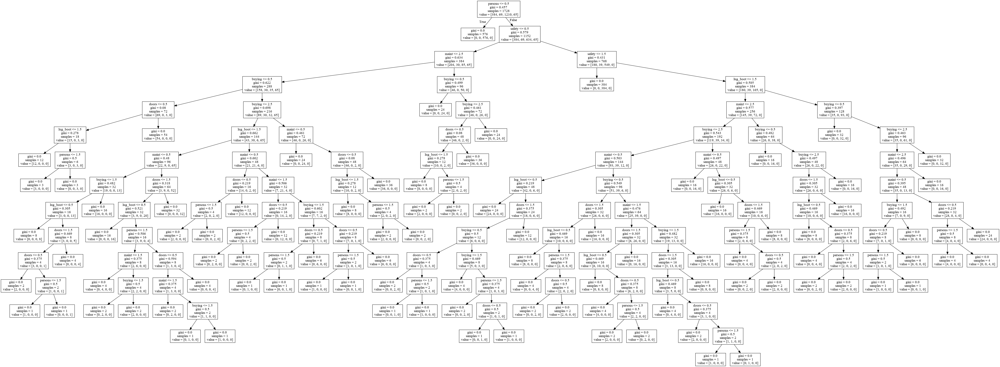

In [7]:
draw_decision_tree(clf, columns[:-1])

Посмотрите, как меняется картинка для различных значений структурных параметров (варьируйте параметры max_depth, criterion, min_samples_leaf, max_features). Убедитесь, что увеличение глубины дерева и уменьшение количества объектов в листьях способствует гибкости модели и, как следствие, переобучению (что соответствует интуитивным соображениям о структуре дерева).

Поварьируем max_depth.

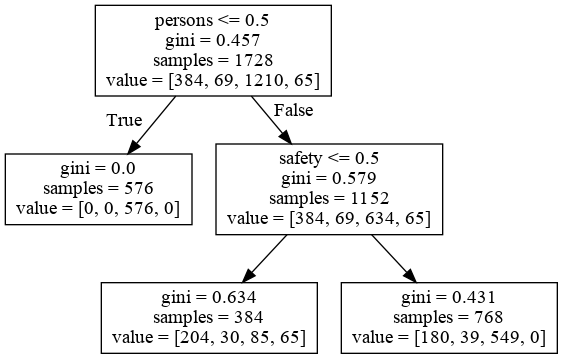

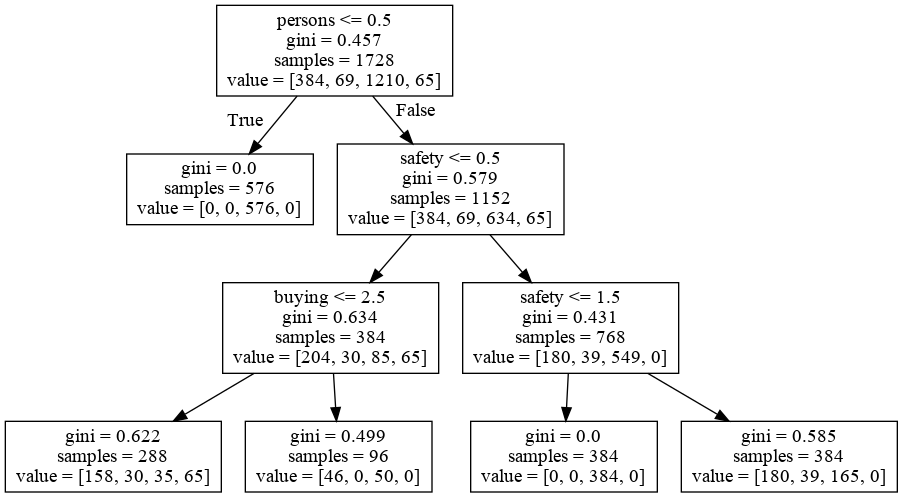

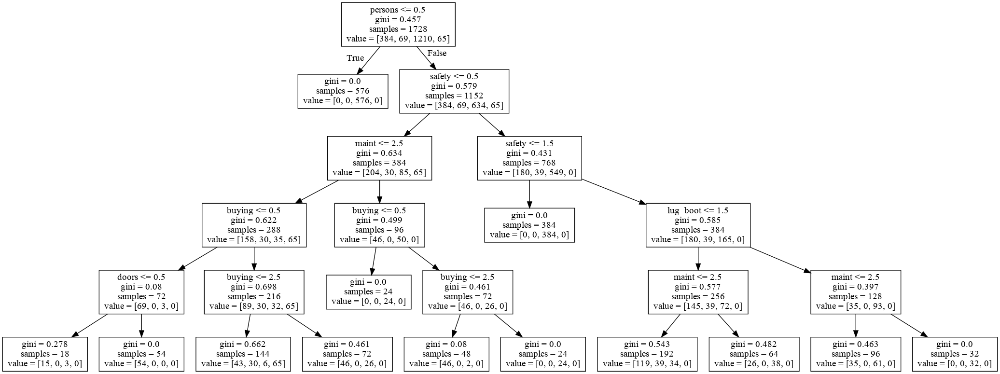

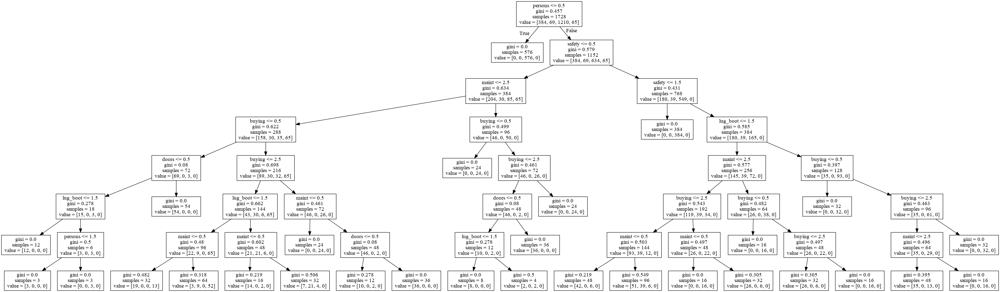

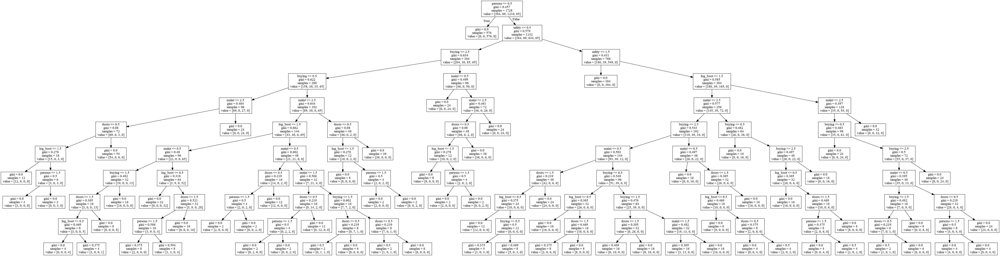

In [8]:
for param in [2, 3, 5, 7, 10]:
    clf = DecisionTreeClassifier(max_depth=param).fit(X, y)
    draw_decision_tree(clf, columns[:-1])

Как мы видим, с ростом глубины дерева, оно сильнее начинает "подстраиваться" под обучающую выборку.

Поварьируем criterion.

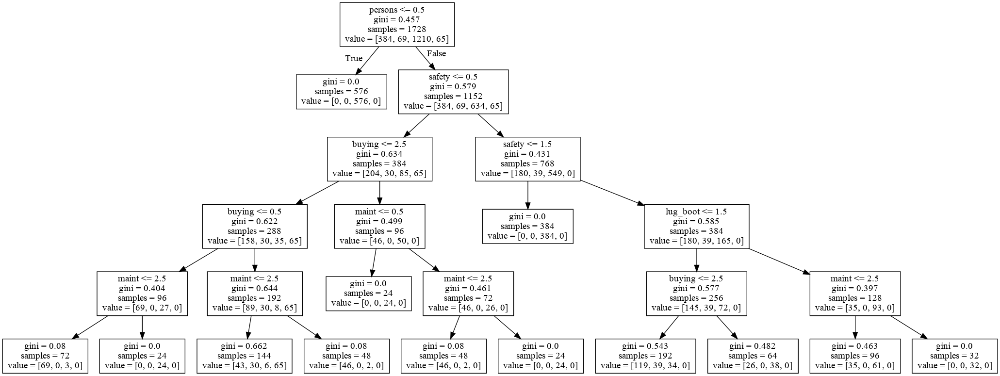

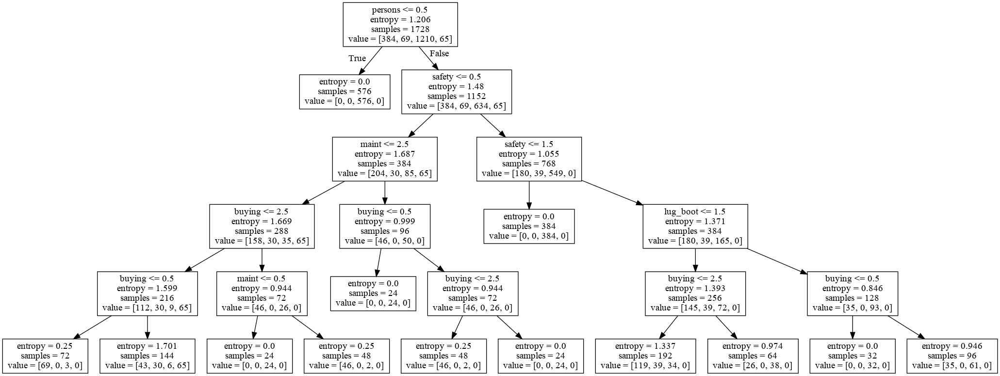

In [9]:
for param in ["gini", "entropy"]:
    clf = DecisionTreeClassifier(criterion=param, max_depth=5).fit(X, y)
    draw_decision_tree(clf, columns[:-1])

Как мы видим, разные критерии дают похожий результат.

Поварьруем min_samples_leaf

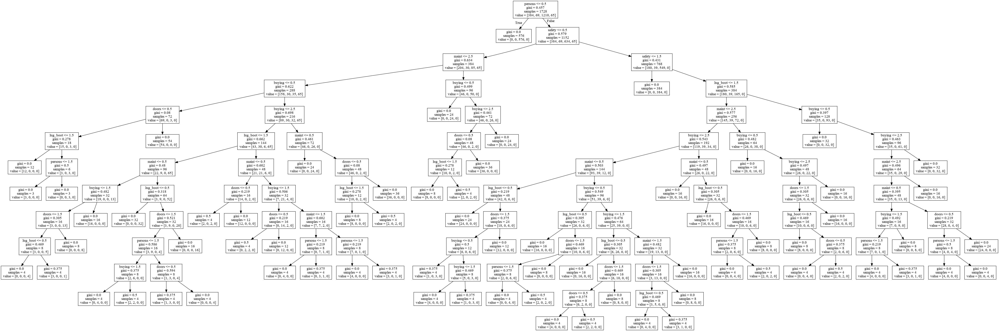

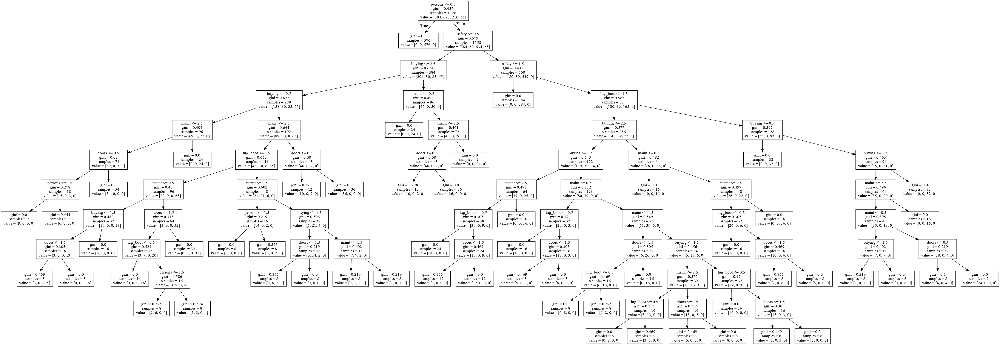

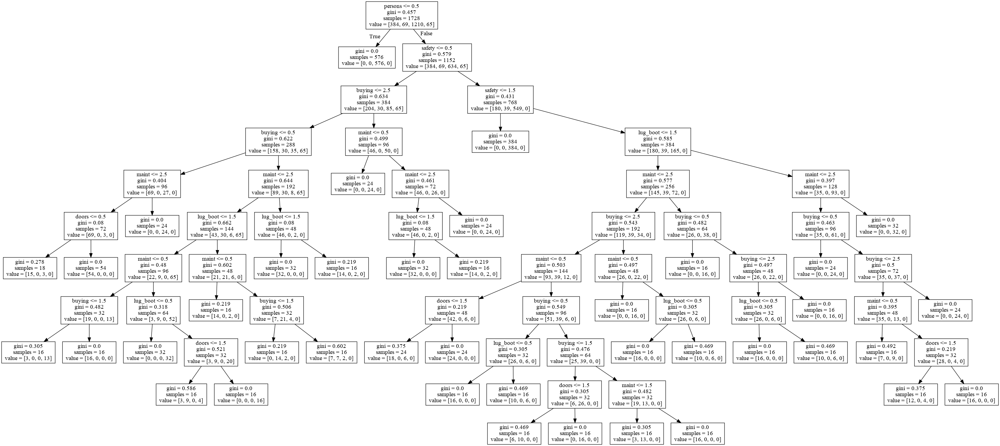

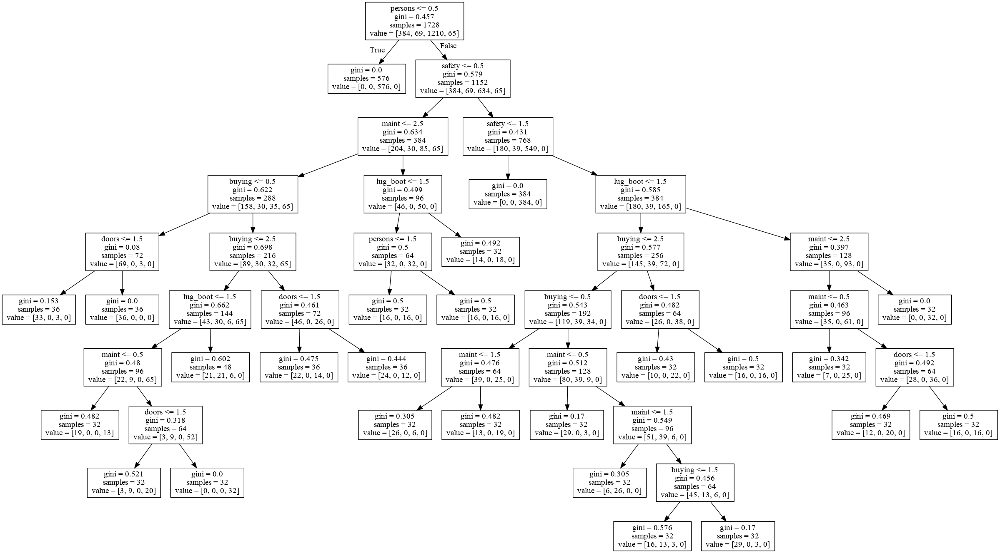

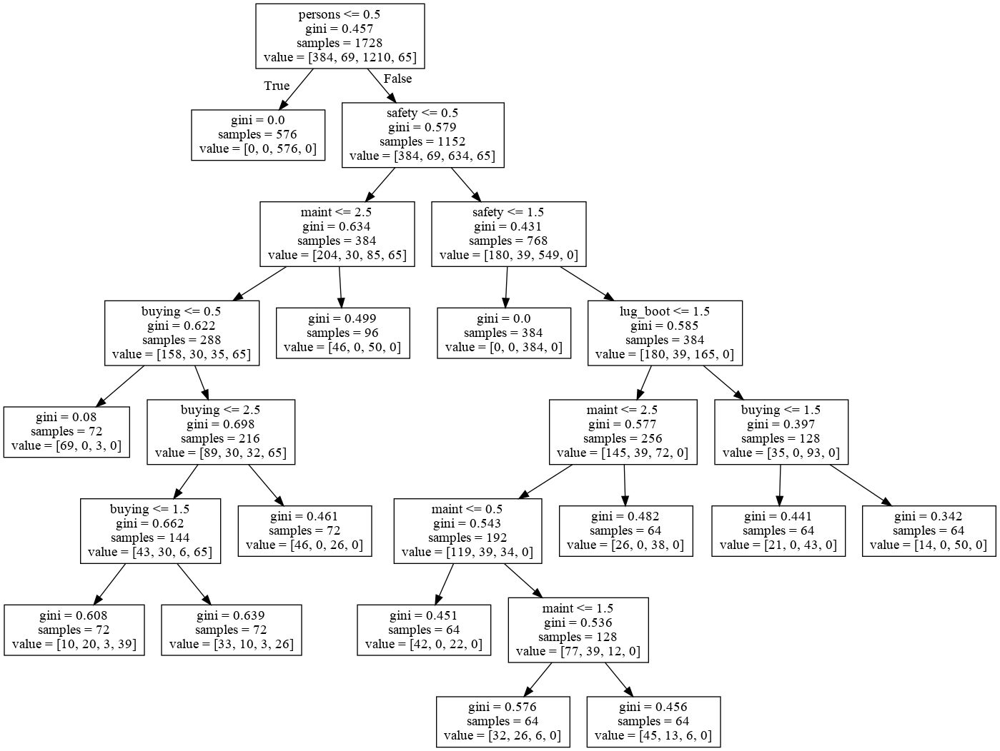

In [10]:
for param in [3, 7, 15, 30, 50]:
    clf = DecisionTreeClassifier(min_samples_leaf=param).fit(X, y)
    draw_decision_tree(clf, columns[:-1])

Поварьруем max_features.

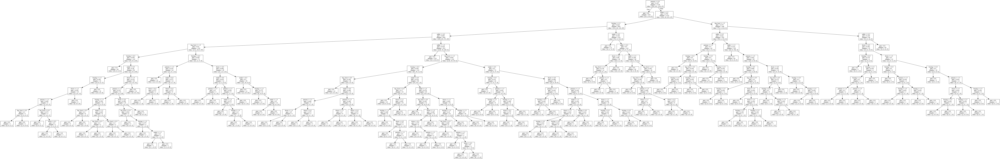

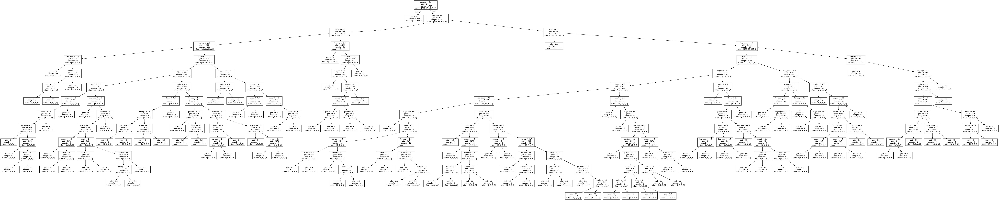

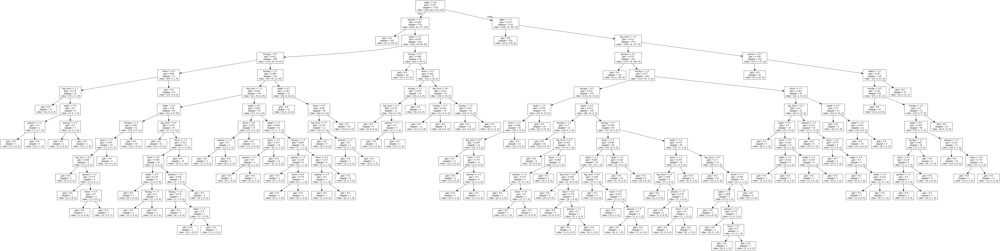

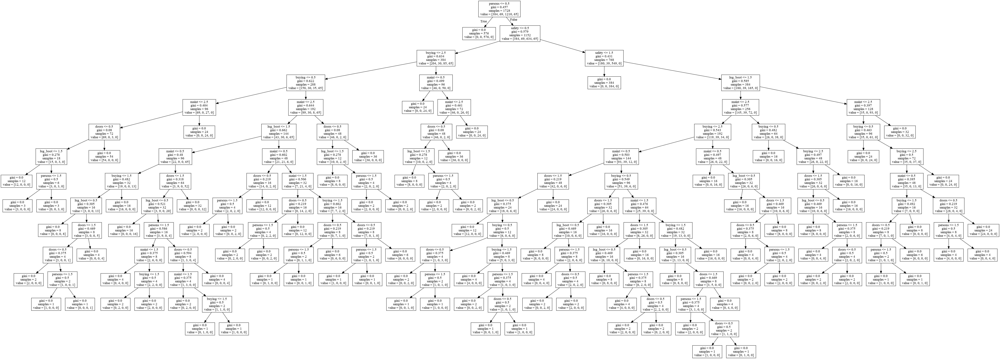

In [11]:
for param in [1, 2, 3, 4, 5, 6]:
    clf = DecisionTreeClassifier(max_features=param).fit(X, y)
    draw_decision_tree(clf, columns[:-1])

## Часть 3. Реализация алгоритма построения дерева решений

##### 50% баллов за задание, оценочное время выполнения 2-3 часа

In [12]:
import numpy as np
from collections import Counter
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.base import BaseEstimator
from sklearn.datasets import make_classification, make_regression, load_digits, load_boston
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, mean_squared_error

Зафиксируем заранее `random_state` (a.k.a. random seed). Это должно повысить вероятность полной воспроизводимости результатов, впрочем, замечено, что тем не менее небольшие флуктуации возможны (например, качества прогнозов дерева, которое мы сейчас вырастим) в случае разных ОС.

In [13]:
RANDOM_STATE = 42

**Необходимо реализовать класс `DecisionTree`**

**Спецификация:**
- класс наследуется от `sklearn.BaseEstimator`;
- конструктор содержит следующие параметры: 
    `max_depth` - максимальная глубина дерева (по умолчанию - `numpy.inf`); 
    `min_samples_split` - минимальное число объектов в вершине, при котором происходит её разбиение (по умолчанию - 2); 
    `criterion` - критерий разбиения (для классификации - 'gini' или 'entropy', для регрессии - 'variance' или 'mad_median'; 
    по умолчанию - 'gini');
    
    Функционал, значение которого максимизируется для поиска оптимального разбиения в данной вершине имеет вид
    $$Q(X, j, t) = F(X) - \dfrac{|X_l|}{|X|} F(X_l) - \dfrac{|X_r|}{|X|} F(X_r),$$
    где $X$ - выборка, находящаяся в текущей вершине, $X_l$ и $X_r$ - разбиение выборки $X$ на две части 
    по предикату $[x_j < t]$, а $F(X)$ -критерий разбиения.
    
    1. Для классификации: пусть $p_i$ - доля объектов $i$-го класса в выборке $X$.
    
        - 'gini': Неопределенность Джини $F(X) = 1 -\sum_{i = 1}^K p_i^2$.
    
        - 'entropy': Энтропия $F(X) = -\sum_{i = 1}^K p_i \log_2(p_i)$.
    
    2. Для регрессии: $y_j = y(x_j)$ - ответ на объекте $x_j$, $y = (y_1, \dots, y_{|X|})$ - вектор ответов.
    
        - 'variance': Дисперсия (среднее квадратичное отклонение от среднего) $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}(y_j - \dfrac{1}{|X|}\sum_{x_i \in X}y_i)^2$
    
        - 'mad_median': Среднее отклонение от медианы $F(X) = \dfrac{1}{|X|} \sum_{x_j \in X}|y_j - \mathrm{med}(y)|$
    
- класс имеет методы `fit`, `predict` и `predict_proba`;
- метод `fit` принимает матрицу объектов `X` и вектор ответов `y` (объекты `numpy.ndarray`) и возвращает экземпляр класса
    `DecisionTree`, представляющий собой решающее дерево, обученное по выборке `(X, y)` с учётом заданных в конструкторе параметров; 
- метод `predict_proba` принимает матрицу объектов `X` и возвращает матрицу `P` размера `X.shape[0] x K`, где `K` - число классов, такую что $p_{ij}$ есть вероятность принадлежности объекта, заданного $i$-ой строкой матрицы `X` к классу $j \in \{1, \dots, K\}$.
- метод `predict` принимает матрицу объектов и возвращает вектор предсказанных ответов; в случае классификации - это 
    наиболее многочисленный класс в листе, в который попал объект, а в случае регрессии - среднее значение ответов по 
    всем объектам этого листа;

**Советы по реализации:**

- Обучение дерева можно реализовать простым жадным рекурсивным алгоритмом: каждый раз выбирать наилучшее разбиение (номер признака и порог по нему).
- Если возможных порогов для разбиения будет слишком много, выбор наилучшего разбиения окажется вычислительно очень громоздкой задачей. Можно ограничить множество порогов любым удобным способом (например, посчитать квантили значений каждого признака или просто взяв случайный набор порогов).
- Лучше не подсматривать решение в готовых нагугленных вариантах. От вас требуется сделать всего лишь максимально простую реализацию того, как строится и применяется решающее дерево, а не применимую на практике универсальную библиотеку.

### Реализация (30% баллов)

In [14]:
def entropy(y):
    p = np.bincount(y)
    p = p[np.where(p > 0)] / len(y)
    return -np.sum(p * np.log2(p))

def gini(y):
    return 1 - np.sum((np.bincount(y) / len(y)) ** 2)

def variance(y):
    return np.var(y)

def mad_median(y):
    return np.mean(np.abs(y - np.median(y)))

In [15]:
class DecisionTree(BaseEstimator):
    
    def __init__(self, max_depth=np.inf, min_samples_split=2, criterion='gini'):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.criterion = criterion
        
    def analyse_init_parameters(self):
        if self.criterion == 'gini':
            self.regression = False
            self.function = gini
        elif self.criterion == 'entropy':
            self.regression = False
            self.function = entropy
        elif self.criterion == 'variance':
            self.regression = True
            self.function = variance
        elif self.criterion == 'mad_median':
            self.regression = True
            self.function = mad_median
        
    class TreeNode:
        """
        Вспомогательный класс для построения дерева.
        """
        def __init__(self, parent):
            self.feature_index = None
            self.threshold = None
            self.is_leaf = False
            if parent != None:
                self.depth = parent.depth + 1
            else:
                self.depth = 0
            self.parent = parent
            self.right = None
            self.left = None
        
        def evaluate_split(self, X, y, feature_index, threshold, function):
            """
            Метод, разделяющий выборку в данном узле по предикату.
            """
            left = np.argwhere(X[:, feature_index] < threshold).flatten()
            right = np.argwhere(X[:, feature_index] >= threshold).flatten()
            y_left = y[left]
            y_right = y[right]
            evaluation = function(y) - len(y_left) / len(y) * function(y_left) - \
                         len(y_right) / len(y) * function(y_right)
            return evaluation, left, right
        
        def evaluate_answer(self, X, y, regression):
            """
            Метод генерации ответа для листа.
            """
            if regression:
                self.answer = np.mean(y)
            else:
                counter = Counter(y)
                self.answer = counter.most_common(1)[0][0]
                self.probabilities = {target: counter[target] / len(y) 
                                      for target in counter.keys()}
        
        def split(self, X, y, min_samples_split, max_depth, function, regression=False):
            """
            Метод, определяющий по данной выборке, является ли вершина листом, или 
            подбирает лучший предикат для разбиения выборки на 2 поддерева.
            """
            if len(y) < min_samples_split or self.depth >= max_depth:
                self.is_leaf = True
                self.evaluate_answer(X, y, regression)
                return
            best_evaluation = -np.inf
            best_left = None
            best_right = None
            for feature_index in range(X.shape[1]):
                limits = np.min(X, axis=0)[feature_index], np.max(X, axis=0)[feature_index]
                if limits[0] == limits[1]:
                    continue
                for threshold in np.linspace(limits[0], limits[1], num=5)[1:-1]:
                    evaluation, left, right = self.evaluate_split(X, y, feature_index, 
                                                                  threshold, function)
                    if evaluation > best_evaluation:
                        best_evaluation = evaluation
                        best_left = left
                        best_right = right
                        self.feature_index = feature_index
                        self.threshold = threshold
            
            self.left = DecisionTree.TreeNode(self)
            self.right = DecisionTree.TreeNode(self)
            self.left.split(X[best_left], y[best_left], min_samples_split, 
                            max_depth, function, regression)
            self.right.split(X[best_right], y[best_right], min_samples_split, 
                             max_depth, function, regression)
        
        def predict(self, x):
            if self.is_leaf:
                return self.answer
            else:
                if x[self.feature_index] < self.threshold:
                    return self.left.predict(x)
                else:
                    return self.right.predict(x)
        
        def predict_proba(self, x, K):
            if self.is_leaf:
                result = np.zeros(K)
                for key, value in self.probabilities.items():
                    result[key] = value
                return result
            else:
                if x[self.feature_index] < self.threshold:
                    return self.left.predict_proba(x, K)
                else:
                    return self.right.predict_proba(x, K)
    
    
    def fit(self, X, y):
        self.analyse_init_parameters()
        if not self.regression:
            self.count_classes = len(set(y))
        self.root = self.TreeNode(None)
        self.root.split(X, y, self.min_samples_split, self.max_depth, 
                        self.function, self.regression)
            
    def predict(self, X):
        prediction = [self.root.predict(X[i]) for i in range(X.shape[0])]
        return np.array(prediction)
        
    def predict_proba(self, X):
        prediction = [self.root.predict_proba(X[i], self.count_classes) for i in range(X.shape[0])]
        return np.array(prediction)

## Тестирование реализованного алгоритма

### Классификация (10% баллов)

С помощью метода `load_digits` загрузите датасет `digits`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие решающие деревья и убедитесь, что критерии gini и entropy дают разные результаты.

In [16]:
digits = load_digits()
X = digits.data
y = digits.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

In [17]:
for param in ['gini', 'entropy']:
    clf = DecisionTree(max_depth=6, criterion=param)
    clf.fit(X_train, y_train)
    pred = clf.predict(X_test)
    print(param, ":", accuracy_score(y_test, pred))

gini : 0.7888888888888889
entropy : 0.825


С помощью 5-кратной кросс-валидации (`GridSearchCV`) подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - range(3, 11), а для criterion - {'gini', 'entropy'}. Критерий качества `scoring`='accuracy'.

In [18]:
parameters = {'max_depth': range(3, 11), 'criterion': ('gini', 'entropy')}
clf = GridSearchCV(DecisionTree(), parameters, cv=5, scoring='accuracy', return_train_score=False)
clf.fit(X, y)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', max_depth=inf, min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(3, 11), 'criterion': ('gini', 'entropy')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
       scoring='accuracy', verbose=0)

Постройте графики средних значений критерия качества `accuracy` для критериев `gini` и `entropy` в зависимости от `max_depth`.

In [19]:
scores_df = pd.DataFrame(clf.cv_results_)
# scores_df.head()

/home/user/study/MIPT/MachineLearning/ml-env/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


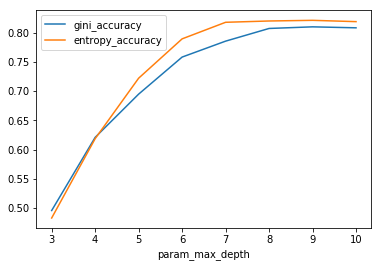

In [20]:
score_gini = scores_df.where(scores_df['param_criterion'] == 'gini')
score_gini = score_gini[['mean_test_score', 'param_max_depth']].dropna()
score_gini = score_gini.rename(columns={'mean_test_score': 'gini_accuracy'})
score_entropy = scores_df.where(scores_df['param_criterion'] == 'entropy')
score_entropy = score_entropy[['mean_test_score', 'param_max_depth']].dropna()
score_entropy = score_entropy.rename(columns={'mean_test_score': 'entropy_accuracy'})
scores = pd.merge(score_gini, score_entropy, on='param_max_depth')
scores.plot(x='param_max_depth', y=['gini_accuracy', 'entropy_accuracy'])

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

В целом, можно сказать, что полученные графики похожи. Оптимальные значения параметров:

In [21]:
clf.best_estimator_

DecisionTree(criterion='entropy', max_depth=9, min_samples_split=2)

Используя найденные оптимальные значения max_depth и criterion, обучите решающее дерево на X_train, y_train и вычислите вероятности принадлежности к классам для X_test.

In [22]:
tree = DecisionTree(**clf.best_params_)
tree.fit(X_train, y_train)

Для полученной матрицы вычислите усредненные по всем объектам из `X_test` значения вероятностей принадлежности к классам.

Чему примерно равна максимальная вероятность в полученном векторе?

In [23]:
predictions = tree.predict_proba(X_test)
predictions.mean(axis=0)

array([0.09722222, 0.07361111, 0.08888889, 0.08888889, 0.11944444,
       0.12777778, 0.10021368, 0.11111111, 0.08173077, 0.11111111])

Максимальная вероятность в полученном векторе чуть больше 10%.

### Регрессия (10% баллов)

С помощью метода `load_boston` загрузите датасет `boston`. Разделите выборку на обучающую и тестовую с помощью метода `train_test_split`, используйте значения параметров `test_size=0.2`, `random_state=42`. Попробуйте обучить неглубокие регрессионные деревья и убедитесь, что критерии `variance` и `mad_median` дают разные результаты.

In [24]:
boston = load_boston()
X = boston.data
y = boston.target
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_STATE)

In [25]:
for param in ['variance', 'mad_median']:
    clf = DecisionTree(max_depth=5, criterion=param)
    clf.fit(X_train, y_train)
    pred = clf.predict(X_test)
    print(param, ":", mean_squared_error(y_test, pred))

variance : 14.481171137933295
mad_median : 14.432585184013028


С помощью 5-кратной кросс-валидации подберите оптимальное значение параметров `max_depth` и `criterion`. Для параметра `max_depth` используйте диапазон значений - `range(2, 9)`, а для `criterion` - {'variance', 'mad_median'}. Критерий качества `scoring`='neg_mean_squared_error'.

In [26]:
parameters = {'max_depth': range(3, 9), 'criterion': ('variance', 'mad_median')}
clf = GridSearchCV(DecisionTree(), parameters, cv=5, 
                   scoring='neg_mean_squared_error', return_train_score=False)
clf.fit(X, y)

GridSearchCV(cv=5, error_score='raise',
       estimator=DecisionTree(criterion='gini', max_depth=inf, min_samples_split=2),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'max_depth': range(3, 9), 'criterion': ('variance', 'mad_median')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
       scoring='neg_mean_squared_error', verbose=0)

In [27]:
scores_df = pd.DataFrame(clf.cv_results_)
# scores_df.head()

Постройте графики средних значений критерия качества `neg_mean_squared_error` для критериев `variance` и `mad_median` в зависимости от `max_depth`.

/home/user/study/MIPT/MachineLearning/ml-env/lib/python3.6/site-packages/pandas/plotting/_core.py:1716: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  series.name = label


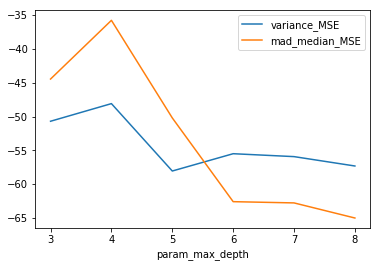

In [28]:
score_variance = scores_df.where(scores_df['param_criterion'] == 'variance')
score_variance = score_variance[['mean_test_score', 'param_max_depth']]
score_variance = score_variance.rename(columns={'mean_test_score': 'variance_MSE'})
score_mad_median = scores_df.where(scores_df['param_criterion'] == 'mad_median')
score_mad_median = score_mad_median[['mean_test_score', 'param_max_depth']]
score_mad_median = score_mad_median.rename(columns={'mean_test_score': 'mad_median_MSE'})
scores = pd.merge(score_variance, score_mad_median, on='param_max_depth')
scores.plot(y=['variance_MSE', 'mad_median_MSE'], x='param_max_depth')

Проанализируйте полученные графики. Чему равны найденные оптимальные значения параметров max_depth и criterion?

In [29]:
clf.best_estimator_

DecisionTree(criterion='mad_median', max_depth=4, min_samples_split=2)